# Data Handling and CSV Creating

In [3]:
import glob
import re
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
from pywt import wavedec
import pywt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix

In [4]:
# Dataset Classes:
# ________________

# Yukari-->Up
# Asagi-->Down
# Sag-->Right 
# Sol-->Left
# Kirp-->Blink 
# Center ????
# what h and v reprenets ??? 


In [5]:
# Define the class labels
class_labels = {
    'yukari': 1,
    'asagi': 2,
    'sag': 3,
    'sol': 4,
    'kirp': 5
}

In [6]:
 h=[]
classes=class_labels.keys()

In [7]:
classes

dict_keys(['yukari', 'asagi', 'sag', 'sol', 'kirp'])

In [12]:
names= np.arange(0,503)

In [13]:
df = pd.read_csv('Data Handling Concat.csv', names=names)

In [14]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,493,494,495,496,497,498,499,500,501,502
0,123,122,127,130,123,123,127,128,125,125,...,143,139,143,141,139,138,142,136,137,1
1,120,132,120,127,126,125,120,125,122,118,...,143,140,139,144,142,139,139,143,134,1
2,136,130,141,136,137,135,144,133,143,144,...,143,141,148,148,144,149,147,150,150,1
3,148,150,139,144,144,144,139,148,142,146,...,135,128,131,132,132,131,133,135,136,1
4,118,112,121,120,116,115,119,116,118,115,...,143,138,135,144,133,133,137,140,95,1


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Columns: 503 entries, 0 to 502
dtypes: int64(503)
memory usage: 786.1 KB


# Sample

In [16]:
x = np.array(df.iloc[0:1 , :-1])

In [17]:
x = x.squeeze()

In [18]:
timee = np.arange(0,len(x))

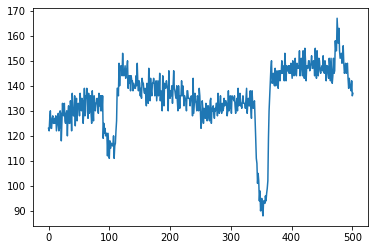

In [19]:
plt.plot(timee , x)

In [20]:
x2 = np.array(df.iloc[1:2 , :-1])

In [21]:
x2 = x2.squeeze()

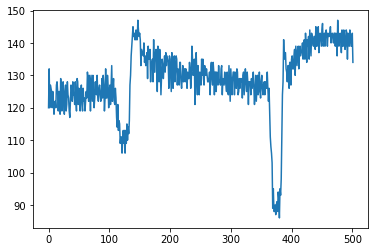

In [22]:
plt.plot(timee , x2)

In [23]:
y1 = np.array(df.iloc[2:3 , :-1])

In [24]:
y1 = y1.squeeze()

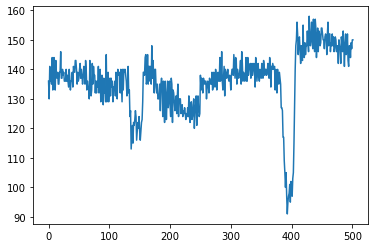

In [25]:
plt.plot(timee , y1) # -------> down 

In [26]:
y2 = np.array(df.iloc[3:4 , :-1])

In [27]:
y2 = y2.squeeze()

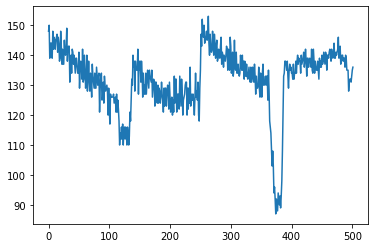

In [28]:
plt.plot(timee , y2)

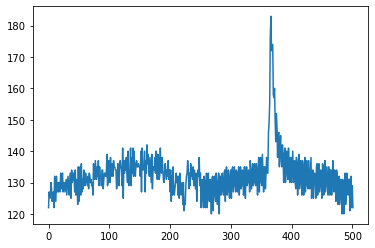

In [29]:
z1 = np.array(df.iloc[134:135 ,:-1])
z1 = z1.squeeze()
plt.plot(timee , z1)

In [30]:
df[134:135]

,0,1,2,3,4,5,6,7,8,9,...,493,494,495,496,497,498,499,500,501,502
134,122,127,125,126,130,128,124,126,127,122,...,126,131,131,121,131,132,122,129,122,4


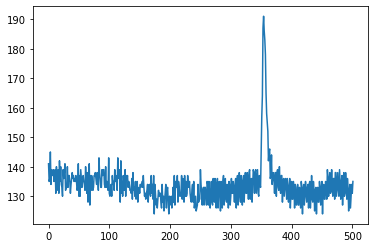

In [31]:
z1 = np.array(df.iloc[135:136 ,:-1])
z1 = z1.squeeze()
plt.plot(timee , z1) #--------- > Left 

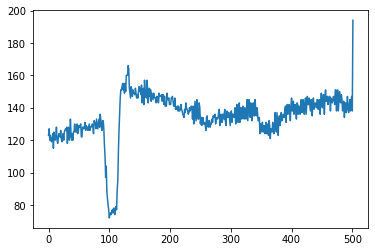

In [32]:
z1 = np.array(df.iloc[176:177 ,:-1])
z1 = z1.squeeze()
plt.plot(timee , z1)

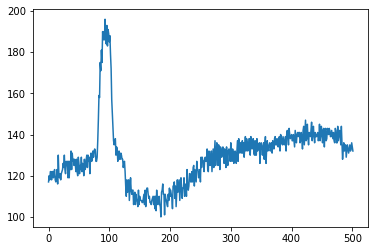

In [33]:
blinkh = np.array(df.iloc[40:41 ,:-1])
blinkh = blinkh.squeeze()
plt.plot(timee , blinkh)

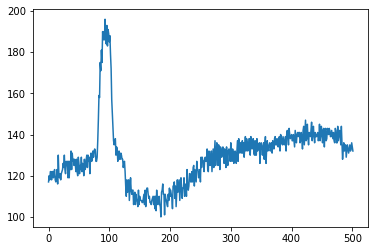

In [34]:
blinkv = np.array(df.iloc[41:42 ,:-1])
blinkv = blinkh.squeeze()
plt.plot(timee , blinkv)

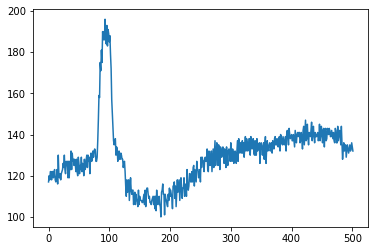

In [35]:
blinkv = np.array(df.iloc[47:48 ,:-1])
blinkv = blinkh.squeeze()
plt.plot(timee , blinkv)

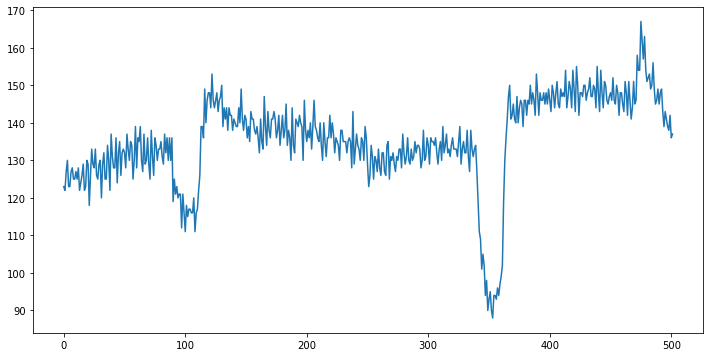

In [36]:
plt.figure(figsize=(12,6))
h = np.array(df.iloc[0:1 ,:-1])
h = h.squeeze()
plt.plot(timee , h)

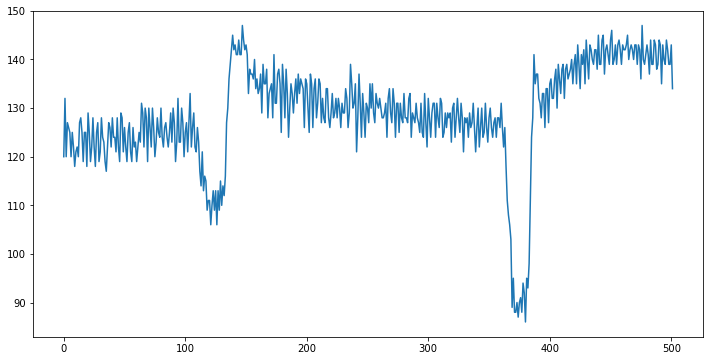

In [37]:
plt.figure(figsize=(12,6))
v = np.array(df.iloc[1:2 ,:-1])
v = v.squeeze()
plt.plot(timee , v)

In [38]:
df[0:1]

,0,1,2,3,4,5,6,7,8,9,...,493,494,495,496,497,498,499,500,501,502
0,123,122,127,130,123,123,127,128,125,125,...,143,139,143,141,139,138,142,136,137,1


In [39]:
df[1:2]

,0,1,2,3,4,5,6,7,8,9,...,493,494,495,496,497,498,499,500,501,502
1,120,132,120,127,126,125,120,125,122,118,...,143,140,139,144,142,139,139,143,134,1


# Preprocessing

In [40]:
x=df.iloc[:,:-1]

In [41]:
x

,0,1,2,3,4,5,6,7,8,9,...,492,493,494,495,496,497,498,499,500,501
0,123,122,127,130,123,123,127,128,125,125,...,149,143,139,143,141,139,138,142,136,137
1,120,132,120,127,126,125,120,125,122,118,...,135,143,140,139,144,142,139,139,143,134
2,136,130,141,136,137,135,144,133,143,144,...,152,143,141,148,148,144,149,147,150,150
3,148,150,139,144,144,144,139,148,142,146,...,135,135,128,131,132,132,131,133,135,136
4,118,112,121,120,116,115,119,116,118,115,...,136,143,138,135,144,133,133,137,140,95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,120,129,126,123,127,127,124,126,127,131,...,148,150,156,151,152,152,153,151,154,125
196,130,129,135,123,131,130,129,124,130,127,...,130,128,129,133,132,127,136,132,128,144
197,126,131,129,130,130,131,130,129,131,126,...,141,146,135,142,142,140,141,146,144,183
198,127,119,125,125,126,126,121,127,129,121,...,125,135,131,129,128,132,132,126,133,153


In [42]:
y=df.iloc[:,-1:]

In [43]:
y

,502
0,1
1,1
2,1
3,1
4,1
...,...
195,0
196,0
197,0
198,0


Text(0, 0.5, "'Amp(v)")

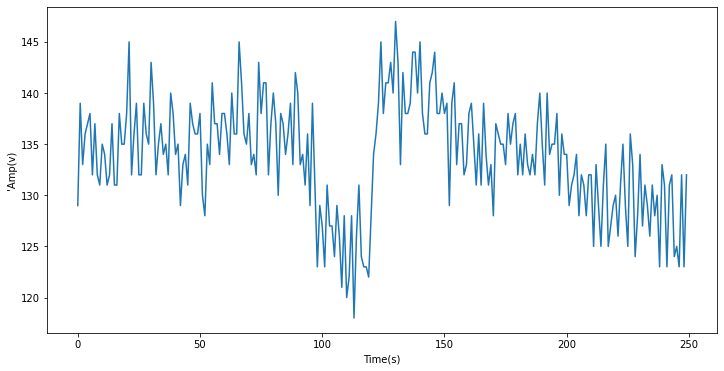

In [44]:
from scipy import signal
from scipy.signal import butter, filtfilt
EOG_signal= open('3-class/asagi1v.txt', 'r')
lines=EOG_signal.readlines()
lines
Amp=[]
for i in range (len(lines)-1):
    L=lines[i+1]
    Amp. append (int(L))
plt.figure(figsize=(12,6))
plt.plot(np.arange(0,len(Amp)),Amp)
plt.xlabel("Time(s)")
plt.ylabel("'Amp(v)")

Text(0, 0.5, "'Amp(v)")

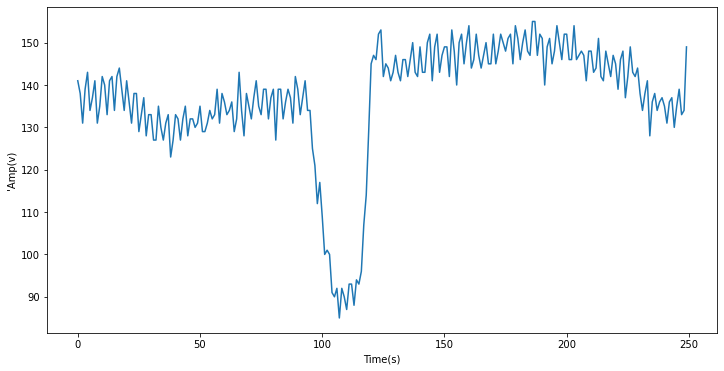

In [45]:
EOG_signal= open('3-class/asagi1h.txt', 'r')
lines=EOG_signal.readlines()
lines
Amp=[]
for i in range (len(lines)-1):
    L=lines[i+1]
    Amp. append (int(L))
plt.figure(figsize=(12,6))
plt.plot(np.arange(0,len(Amp)),Amp)
plt.xlabel("Time(s)")
plt.ylabel("'Amp(v)")

# butter bandpass filter

In [46]:
def butter_bandpass_filter(Input_Signal, Low_Cutoff, High_Cutoff,Sampling_Rate, order):
    nyq = 0.5*Sampling_Rate
    low=Low_Cutoff/nyq
    high =High_Cutoff/nyq
    Numerator, denominator = butter(order,[low,high],btype='band', output='ba',analog=False, fs=None)
    filtered = filtfilt(Numerator,denominator,Input_Signal)
    return filtered

In [47]:
filtered_signal = butter_bandpass_filter(x,Low_Cutoff=0.5,High_Cutoff=20.0,Sampling_Rate=176,order=2)

Text(0, 0.5, 'Amp(v)')

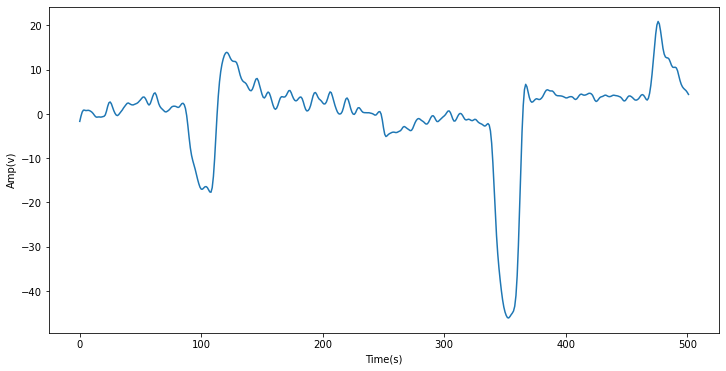

In [48]:
# tryyyy
filtered_signal1 = butter_bandpass_filter(x.iloc[0:1,:],Low_Cutoff=0.5,High_Cutoff=20.0,Sampling_Rate=176,order=2)
filtered_signal1=filtered_signal1.squeeze()
plt.figure(figsize=(12,6))
plt.plot(np.arange(0,len(filtered_signal1)),filtered_signal1)
plt.xlabel("Time(s)")
plt.ylabel("Amp(v)")


In [49]:
check=filtered_signal[0]==filtered_signal1

In [50]:
check.all()
#tryyy ends here

True

In [51]:
filtered_signal

array([[ -1.67090245,  -0.49220985,   0.43389551, ...,   5.26530515,
          4.88484352,   4.41859539],
       [  0.58260176,   3.18603098,   4.98932365, ...,   8.90420084,
          6.76110787,   3.93709751],
       [  0.95421417,   1.02246381,   1.27957231, ...,  -2.64199126,
         -1.87937791,  -1.1027977 ],
       ...,
       [ -1.55169762,   0.14883329,   1.42482327, ..., -48.59152383,
        -36.14842015, -19.7796298 ],
       [ -1.76319785,  -3.3092342 ,  -4.25200334, ..., -30.10304691,
        -22.99914845, -13.44046122],
       [ -1.87522438,  -2.80906385,  -3.56839662, ...,  -3.96206417,
         -3.0291301 ,  -1.82825418]])

C:\Users\EGYPT\AppData\Local\Temp/ipykernel_12184/3049312574.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,6))


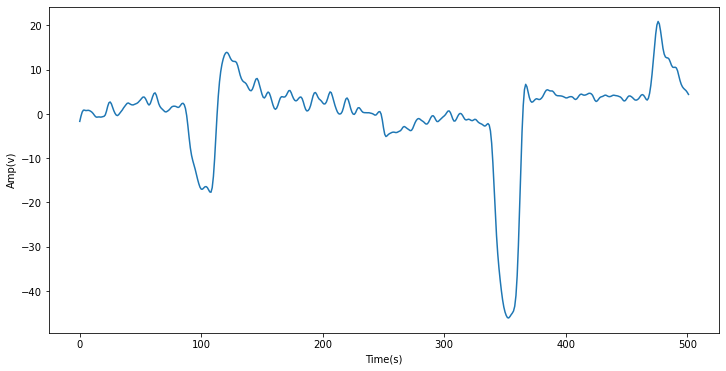

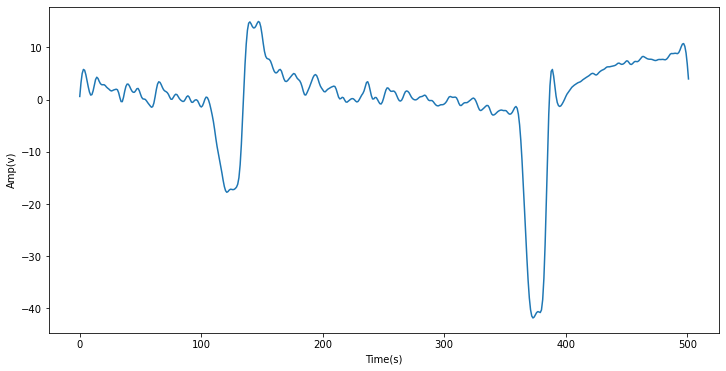

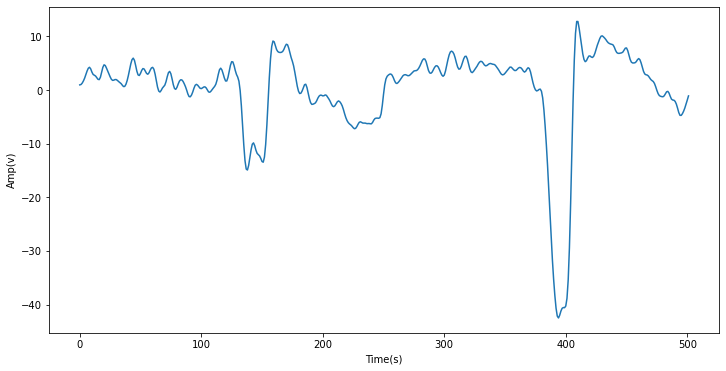

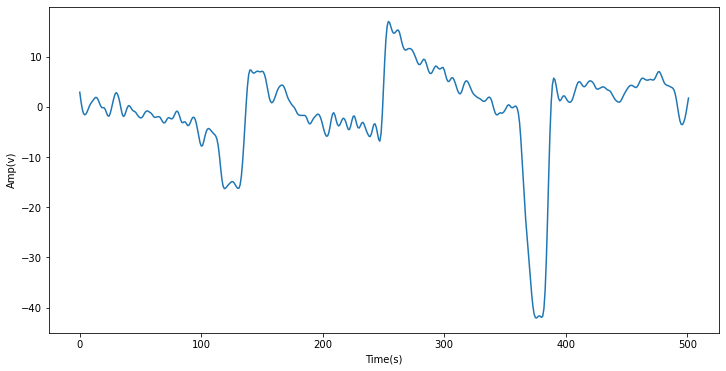

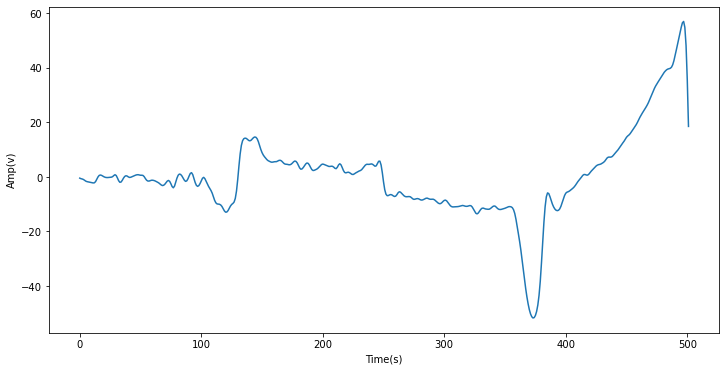

...

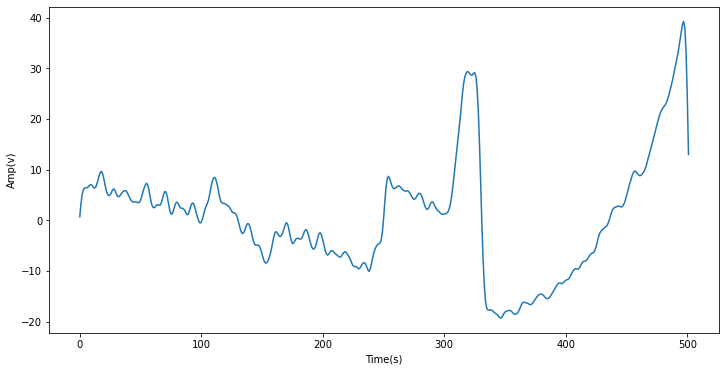

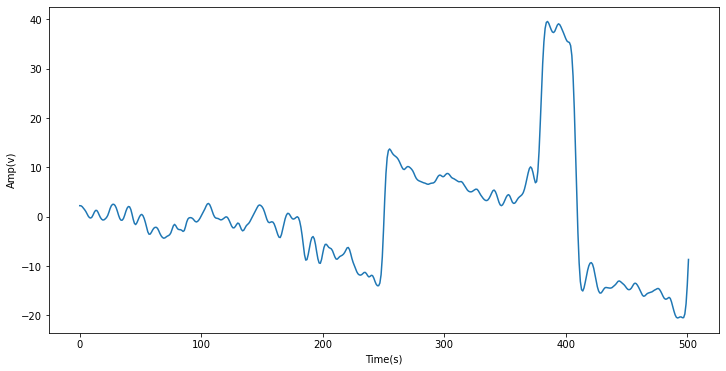

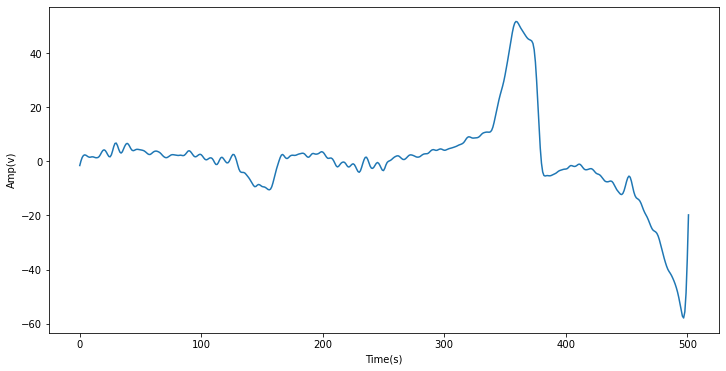

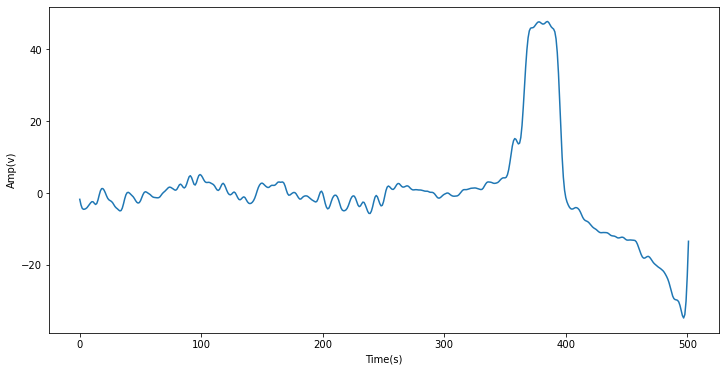

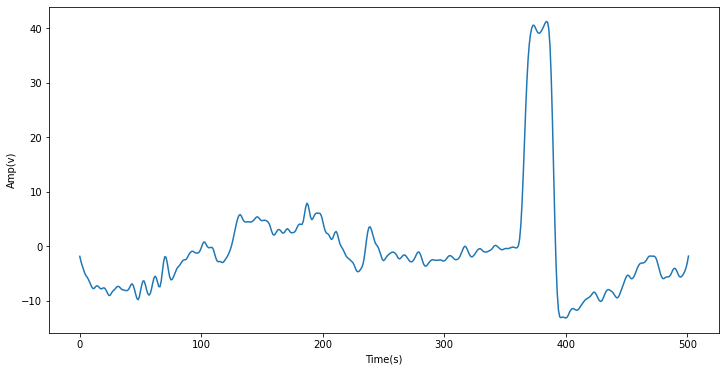

In [52]:
for i in filtered_signal:
    
    plt.figure(figsize=(12,6))
    plt.plot(np.arange(0,len(i)),i)
    plt.xlabel("Time(s)")
    plt.ylabel("Amp(v)")

# Resampling

In [53]:
resampled_Signal = []
for i in filtered_signal:
    re_Sgnl = signal.resample(i,60)
    resampled_Signal.append(re_Sgnl)

C:\Users\EGYPT\AppData\Local\Temp/ipykernel_12184/917735618.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,6))


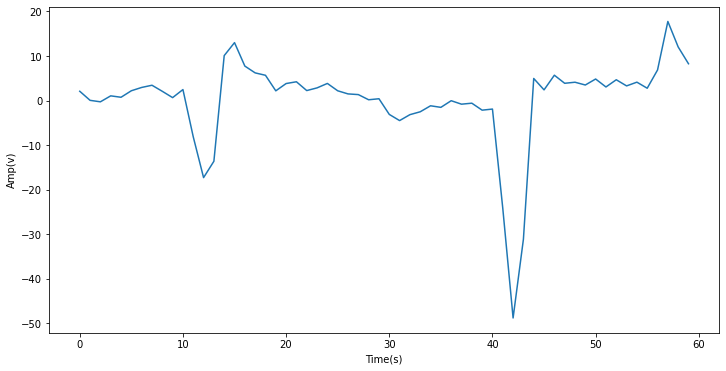

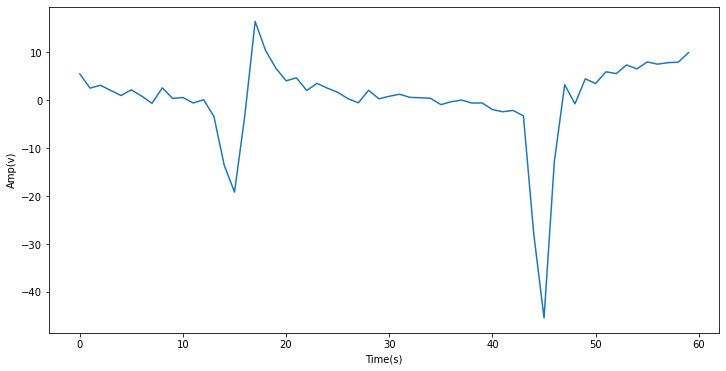

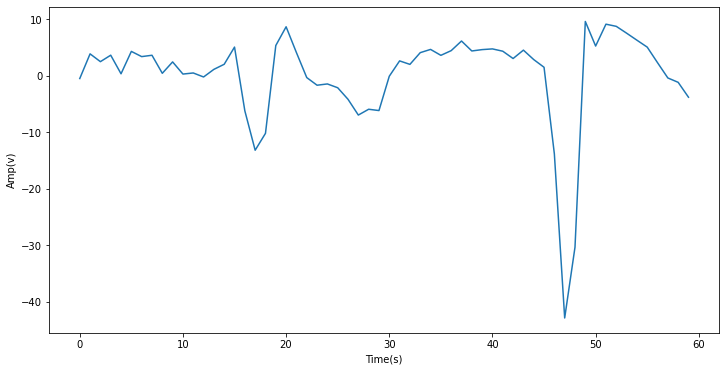

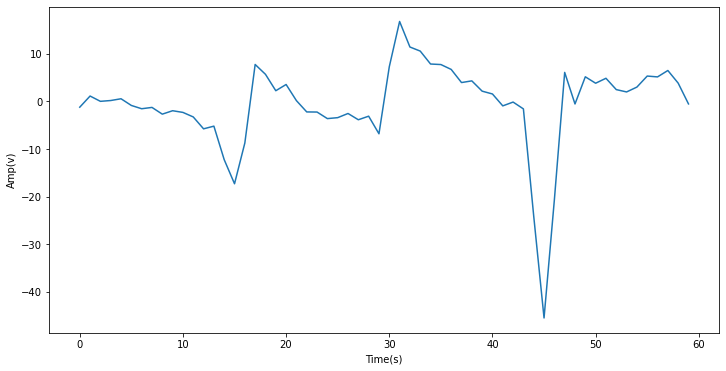

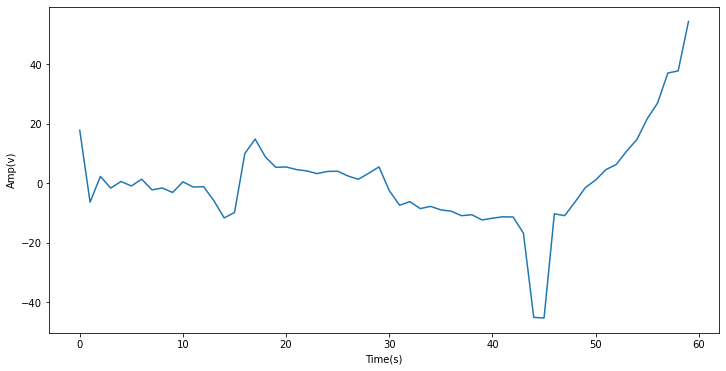

...

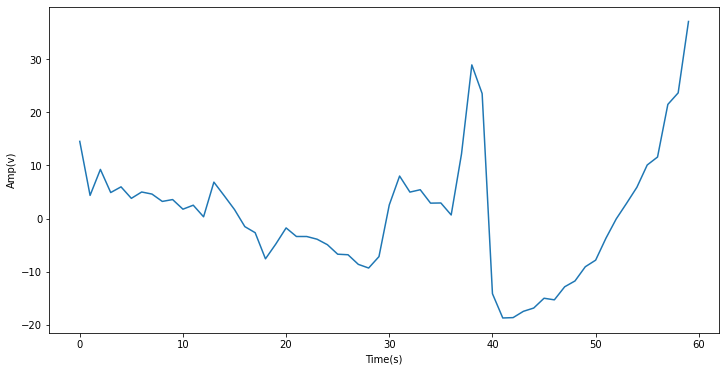

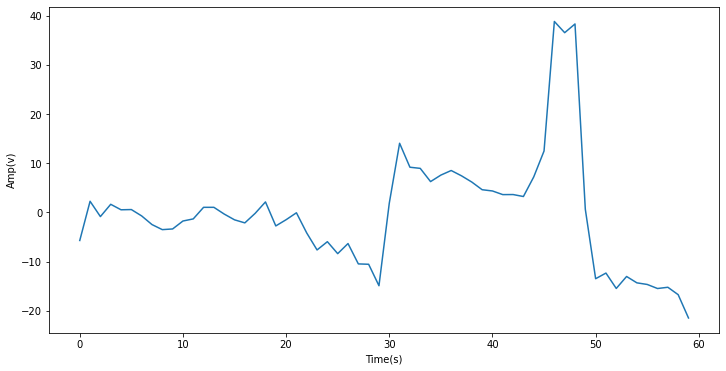

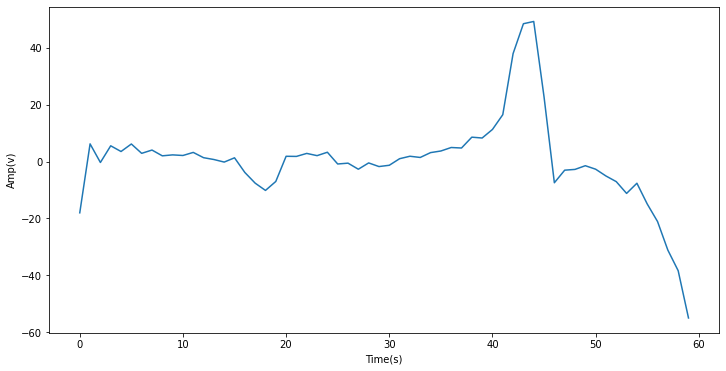

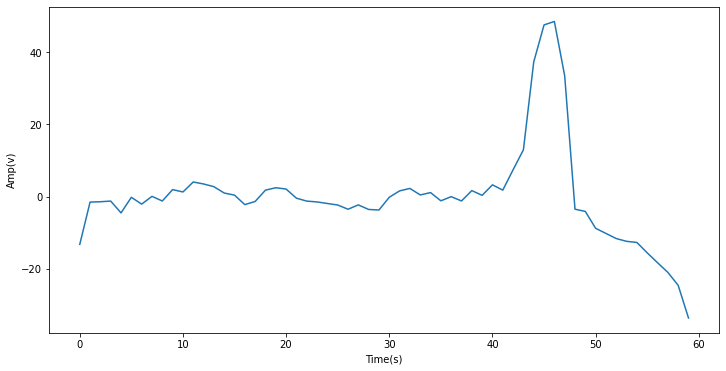

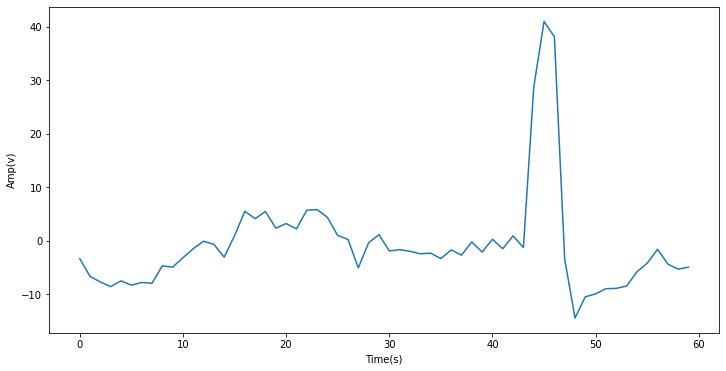

In [54]:
for i in resampled_Signal:
    plt.figure(figsize=(12,6))
    plt.plot(np.arange(0,len(i)),i)
    plt.xlabel("Time(s)")
    plt.ylabel("Amp(v)")

In [55]:
len(resampled_Signal)

200

In [56]:
len(filtered_signal)

200

In [57]:
resampled_Signal

[array([ 2.08492804e+00,  4.93368891e-02, -2.81082303e-01,  1.05668744e+00,
         7.40662633e-01,  2.20098390e+00,  2.94302521e+00,  3.43731796e+00,
         2.07630252e+00,  6.60084312e-01,  2.46694472e+00, -8.14358491e+00,
        -1.72927262e+01, -1.36219596e+01,  1.00911342e+01,  1.30018088e+01,
         7.73956699e+00,  6.21175438e+00,  5.67278197e+00,  2.18324002e+00,
         3.81855059e+00,  4.21741177e+00,  2.24070382e+00,  2.84566867e+00,
         3.84318184e+00,  2.19397384e+00,  1.49334304e+00,  1.33991849e+00,
         1.79152215e-01,  4.07062129e-01, -3.10807290e+00, -4.49456257e+00,
        -3.16292676e+00, -2.51693768e+00, -1.17251572e+00, -1.52403579e+00,
        -3.38133247e-02, -8.11179946e-01, -5.90459685e-01, -2.15533858e+00,
        -1.90953874e+00, -2.41760568e+01, -4.87933915e+01, -3.11325695e+01,
         4.95594380e+00,  2.40075579e+00,  5.68884215e+00,  3.87609238e+00,
         4.11496162e+00,  3.49000659e+00,  4.83503323e+00,  3.04974374e+00,
         4.6

# Remove DC component 

In [58]:
Mean=[np.mean(resampled_Signal[i]) for i in range(len(resampled_Signal))]
Mean

[0.20750720440328538,
 0.2743487536226077,
 0.19344972538401853,
 -0.6123504498943368,
 0.26918809813768096,
 0.277259740517581,
 -0.12359084835991488,
 -0.2401807752018949,
 0.13331606975227028,
 -0.533512872994347,
 0.23378188539767983,
 0.25314567267845534,
 0.6011567474811538,
 -0.4363928959834148,
 -0.7224950768752141,
 0.7855745012043401,
 -0.7595059685531311,
 -0.4318279741335712,
 0.19397949189944172,
 -0.3908462812026754,
 -0.09838762417630668,
 0.16571744477911024,
 -0.5354161639805952,
 0.2443905582109556,
 0.10551272136133531,
 -0.03090827164172189,
 -0.5114472126551645,
 0.10469098084758911,
 -0.163105461251807,
 0.0039260234864323985,
 -0.057439831410073756,
 0.2038309531365746,
 -0.07324583665318804,
 0.12724140892410796,
 0.5769200610908011,
 -0.38651366169138135,
 -0.1800267367899887,
 0.17601582535681579,
 0.0337725167408629,
 0.4223497877616127,
 0.5242393251519696,
 1.5780980152344353,
 0.3498809508794618,
 0.12087415040561009,
 -0.12657485565424154,
 -0.13417219589

In [59]:
RemovedDC_signal=[(resampled_Signal[i]-Mean[i]) for i in range (len(resampled_Signal))]
RemovedDC_signal

[array([ 1.87742083e+00, -1.58170315e-01, -4.88589507e-01,  8.49180234e-01,
         5.33155429e-01,  1.99347670e+00,  2.73551801e+00,  3.22981075e+00,
         1.86879531e+00,  4.52577108e-01,  2.25943752e+00, -8.35109212e+00,
        -1.75002334e+01, -1.38294668e+01,  9.88362698e+00,  1.27943016e+01,
         7.53205979e+00,  6.00424718e+00,  5.46527476e+00,  1.97573281e+00,
         3.61104339e+00,  4.00990457e+00,  2.03319662e+00,  2.63816147e+00,
         3.63567463e+00,  1.98646663e+00,  1.28583584e+00,  1.13241129e+00,
        -2.83549893e-02,  1.99554925e-01, -3.31558010e+00, -4.70206977e+00,
        -3.37043396e+00, -2.72444488e+00, -1.38002293e+00, -1.73154299e+00,
        -2.41320529e-01, -1.01868715e+00, -7.97966889e-01, -2.36284578e+00,
        -2.11704594e+00, -2.43835640e+01, -4.90008987e+01, -3.13400767e+01,
         4.74843660e+00,  2.19324858e+00,  5.48133494e+00,  3.66858517e+00,
         3.90745442e+00,  3.28249938e+00,  4.62752602e+00,  2.84223654e+00,
         4.4

# Test 

In [60]:
0.81301868 - 0.5064289135091282 <= 3.06589771e-01

True

In [61]:
re_test = np.array([  0.81301868,   0.3601039 ,   0.14513977,  -1.17577473,
         -0.53823931,   1.72442962,  -0.60401088,   0.33486902,
          1.71167779,   1.25454563,   2.57321225,   1.86504724,
          2.5812059 ,   1.70716615,  -1.13824244,   0.32223292,
         -0.07353863,   0.65695246,  -7.3249384 , -15.43074028,
        -18.35932599, -19.59094499, -14.06889241,   6.24185983,
         10.97320533,  10.21512092,   7.38316006,   4.56208819,
          2.82634885,   4.80054616,   1.77125203,   1.51904352,
         -1.0693733 ,   0.65598611,   2.22183091,   1.51880745,
          1.08748526,  -0.30976738,   0.51166342,   3.32713396,
          0.62802419,   4.2768596 ,   0.68011562,   1.53513805,
          3.44766086,   2.14254846,   3.21678154,   3.68829449,
          3.97226225,   5.75241604])
re_mean_test = 0.5064289135091282

In [62]:
re_test - re_mean_test 

array([ 3.06589766e-01, -1.46325014e-01, -3.61289144e-01, -1.68220364e+00,
       -1.04466822e+00,  1.21800071e+00, -1.11043979e+00, -1.71559894e-01,
        1.20524888e+00,  7.48116716e-01,  2.06678334e+00,  1.35861833e+00,
        2.07477699e+00,  1.20073724e+00, -1.64467135e+00, -1.84195994e-01,
       -5.79967544e-01,  1.50523546e-01, -7.83136731e+00, -1.59371692e+01,
       -1.88657549e+01, -2.00973739e+01, -1.45753213e+01,  5.73543092e+00,
        1.04667764e+01,  9.70869201e+00,  6.87673115e+00,  4.05565928e+00,
        2.31991994e+00,  4.29411725e+00,  1.26482312e+00,  1.01261461e+00,
       -1.57580221e+00,  1.49557196e-01,  1.71540200e+00,  1.01237854e+00,
        5.81056346e-01, -8.16196294e-01,  5.23450649e-03,  2.82070505e+00,
        1.21595276e-01,  3.77043069e+00,  1.73686706e-01,  1.02870914e+00,
        2.94123195e+00,  1.63611955e+00,  2.71035263e+00,  3.18186558e+00,
        3.46583334e+00,  5.24598713e+00])

In [63]:
resampled_Signal

[array([ 2.08492804e+00,  4.93368891e-02, -2.81082303e-01,  1.05668744e+00,
         7.40662633e-01,  2.20098390e+00,  2.94302521e+00,  3.43731796e+00,
         2.07630252e+00,  6.60084312e-01,  2.46694472e+00, -8.14358491e+00,
        -1.72927262e+01, -1.36219596e+01,  1.00911342e+01,  1.30018088e+01,
         7.73956699e+00,  6.21175438e+00,  5.67278197e+00,  2.18324002e+00,
         3.81855059e+00,  4.21741177e+00,  2.24070382e+00,  2.84566867e+00,
         3.84318184e+00,  2.19397384e+00,  1.49334304e+00,  1.33991849e+00,
         1.79152215e-01,  4.07062129e-01, -3.10807290e+00, -4.49456257e+00,
        -3.16292676e+00, -2.51693768e+00, -1.17251572e+00, -1.52403579e+00,
        -3.38133247e-02, -8.11179946e-01, -5.90459685e-01, -2.15533858e+00,
        -1.90953874e+00, -2.41760568e+01, -4.87933915e+01, -3.11325695e+01,
         4.95594380e+00,  2.40075579e+00,  5.68884215e+00,  3.87609238e+00,
         4.11496162e+00,  3.49000659e+00,  4.83503323e+00,  3.04974374e+00,
         4.6

# Visualization on DC component

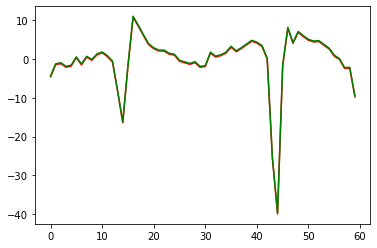

In [64]:
plt.plot(np.arange(0,len(resampled_Signal[7])), resampled_Signal[7], "red")
plt.plot(np.arange(0,len(RemovedDC_signal[7])), RemovedDC_signal[7], "green")

## Discrete Wavelet Transform

In [65]:
coeffs = wavedec(RemovedDC_signal , 'db1', level = 2)
coeffs

[array([[  1.03992062,   4.24598044,  -1.88514109, ...,   7.32985818,
           7.01290689,  22.0392039 ],
        [  6.02295924,   1.11562503,   0.90645008, ...,   6.00406054,
          13.15527209,  16.03647099],
        [  4.36651049,   5.44683536,   1.44632679, ...,  -3.5671629 ,
          13.4359203 ,  -1.91446948],
        ...,
        [ -3.75385598,   7.87354012,   4.4036157 , ...,  -6.45399298,
         -20.8723594 , -73.32652491],
        [ -8.45984466,  -3.11553387,   3.26917373, ..., -13.04371275,
         -25.89468285, -48.49090463],
        [-11.65735601, -14.29038212,  -5.67146243, ..., -20.41516846,
         -12.20525232,  -6.62533805]]),
 array([[  0.67932989,  -1.71934832,   4.20651351, ...,  -0.13990438,
           0.53216154,   2.15903403],
        [  1.41878253,   1.46618292,   1.48870455, ...,  -2.8539074 ,
          -0.80242552,  -1.23871654],
        [ -1.37575679,  -1.17848335,   1.04722145, ..., -17.56642322,
           2.46185731,   3.44293379],
        ...,


In [66]:
res = pywt.waverec([coeffs[0],coeffs[1]],'db1') 
res

array([[  1.2156937 ,   0.25497615,   1.78659871, ...,   4.58257898,
         17.11073813,  14.05740293],
       [  5.26210607,   3.25564457,   1.82561391, ...,   9.86958263,
         10.46359252,  12.21540225],
       [  2.11478222,   4.06039613,   3.01818065, ...,   7.75983436,
          1.08078747,  -3.78825618],
       ...,
       [ -8.67967206,   3.37091803,   6.54995528, ..., -16.27179993,
        -37.28906022, -66.4103058 ],
       [-10.25511641,  -1.70891065,  -3.15732681, ..., -19.81796966,
        -27.61693942, -40.95955556],
       [ -6.02650635, -10.45948462, -10.12581963, ...,  -6.03390091,
         -3.16727856,  -6.20236436]])

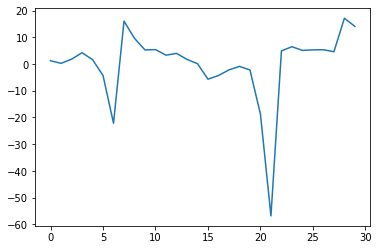

In [67]:
plt.plot(np.arange(0,len(res[0])), res[0])

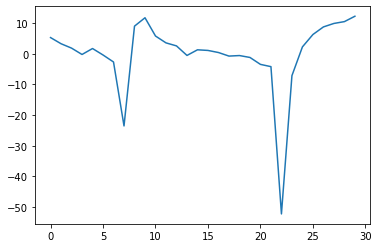

In [68]:
plt.plot(np.arange(0,len(res[1])), res[1])

# Classifcation

# Train Test Split

In [69]:
X_train, X_test, y_train, y_test = train_test_split(res, y, test_size=0.20, random_state=40,stratify = y)

In [70]:
scaler = MinMaxScaler()

In [71]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [72]:
print(X_train.shape)
print(X_test.shape)

(160, 30)
(40, 30)


In [73]:
y.value_counts()

502
0      40
1      40
2      40
3      40
4      40
dtype: int64

In [74]:
y_train.value_counts()

502
0      32
1      32
2      32
3      32
4      32
dtype: int64

In [75]:
from matplotlib import pyplot as plt

def f_importances(coef, names, top=-1):
    imp = coef
    imp, names = zip(*sorted(list(zip(imp, names))))

    # Show all features
    if top == -1:
        top = len(names)

    plt.barh(range(top), imp[::-1][0:top], align='center')
    plt.yticks(range(top), names[::-1][0:top])
    plt.title('feature importances')
    plt.show()
    

# Best Model

# KNN Algorthim

In [76]:
from sklearn.neighbors import KNeighborsClassifier

In [77]:
knn = KNeighborsClassifier(n_neighbors=2)

In [78]:
knn.fit(X_train, y_train)

C:\Users\EGYPT\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier(n_neighbors=2)

In [79]:
ytrain_pred_knn = knn.predict(X_train)

In [80]:
ytest_pred_knn = knn.predict(X_test)

In [81]:
knn_train_score = knn.score(X_train,y_train)
knn_train_score

1.0

In [82]:
knn_test_score = knn.score(X_test,y_test)
knn_test_score

1.0

In [83]:
error = abs(round(knn_test_score - knn_train_score, 2))
error

0.0

In [84]:
metrics.accuracy_score(y_test,ytest_pred_knn)

1.0

In [85]:
conf_mat_knn =confusion_matrix(y_test,ytest_pred_knn)
conf_mat_knn

array([[8, 0, 0, 0, 0],
       [0, 8, 0, 0, 0],
       [0, 0, 8, 0, 0],
       [0, 0, 0, 8, 0],
       [0, 0, 0, 0, 8]], dtype=int64)

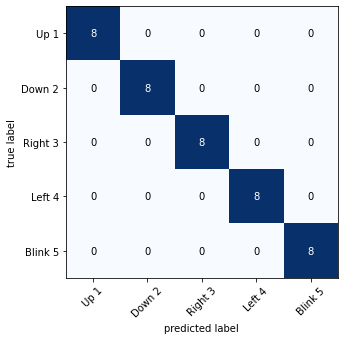

In [86]:
plot_confusion_matrix(conf_mat_knn,class_names=["Up 1","Down 2","Right 3","Left 4", "Blink 5"],figsize=(12,5)); #fn

# SVM Algorthim

In [87]:
from sklearn.svm import SVC
svm = SVC(kernel = 'rbf',C = 16)
svm.fit(X_train,y_train)

C:\Users\EGYPT\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


SVC(C=16)

In [88]:
svm.score(X_train,y_train)

1.0

In [89]:
svm.score(X_test,y_test)

1.0

In [90]:
error = abs(round(svm.score(X_test, y_test) - svm.score(X_train, y_train), 4))
error

0.0

In [91]:
ypred_svm=svm.predict(X_test)

In [92]:
metrics.accuracy_score(y_test,ypred_svm)

1.0

In [93]:
conf_mat_svm = metrics.confusion_matrix (y_test,ypred_svm)

In [94]:
conf_mat_svm

array([[8, 0, 0, 0, 0],
       [0, 8, 0, 0, 0],
       [0, 0, 8, 0, 0],
       [0, 0, 0, 8, 0],
       [0, 0, 0, 0, 8]], dtype=int64)

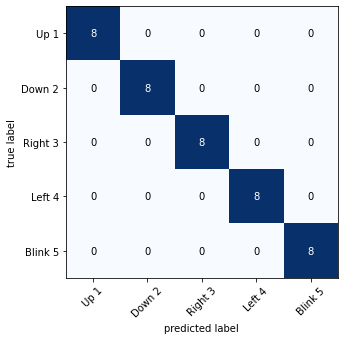

In [95]:
plot_confusion_matrix(conf_mat_svm,class_names=["Up 1","Down 2","Right 3","Left 4", "Blink 5"],figsize=(12,5)); #fn

# Naive Bayes Algorthim

In [96]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(X_train, y_train)

C:\Users\EGYPT\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


GaussianNB()

In [97]:
nb.predict(X_test)

array([1, 0, 1, 3, 2, 0, 1, 4, 2, 3, 4, 3, 1, 4, 2, 2, 2, 0, 1, 1, 1, 0,
       2, 4, 2, 3, 3, 3, 0, 0, 4, 2, 0, 4, 1, 4, 4, 3, 3, 0], dtype=int64)

In [98]:
nb.score(X_train,y_train)

0.9625

In [99]:
nb.score(X_test,y_test)

1.0

In [100]:
error = abs(round(nb.score(X_test, y_test) - nb.score(X_train, y_train), 2))
error

0.04

In [101]:
 ytest_pred_nb = nb.predict(X_test)

In [102]:
ytrain_pred_nb = nb.predict(X_train)

In [103]:
metrics.accuracy_score(y_test,ytest_pred_nb)

1.0

In [104]:
conf_mat_nb =confusion_matrix(y_test,ytest_pred_nb)
conf_mat_nb

array([[8, 0, 0, 0, 0],
       [0, 8, 0, 0, 0],
       [0, 0, 8, 0, 0],
       [0, 0, 0, 8, 0],
       [0, 0, 0, 0, 8]], dtype=int64)

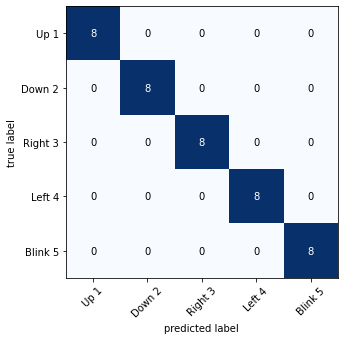

In [105]:
plot_confusion_matrix(conf_mat_nb,class_names=["Up 1","Down 2","Right 3","Left 4", "Blink 5"],figsize=(12,5)); #fn

# LogisticRegression Model

In [106]:
from sklearn.linear_model import LogisticRegression

In [107]:
log = LogisticRegression(C = 0.04,max_iter=6000, random_state=40,verbose=1,penalty='none')

In [108]:
log.fit(X_train,y_train)

C:\Users\EGYPT\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1322: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\EGYPT\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(C=0.04, max_iter=6000, penalty='none', random_state=40,
                   verbose=1)

In [109]:
log.score(X_train,y_train)

1.0

In [110]:
log.score(X_test , y_test)

1.0

In [111]:
error = abs(round(log.score(X_test, y_test) - log.score(X_train, y_train), 2))
error

0.0

In [112]:
ytest_pred_log = log.predict(X_test)

In [113]:
ytrain_pred_log = log.predict(X_train)

In [114]:
metrics.accuracy_score(y_test,ytest_pred_log)

1.0

In [115]:
conf_mat_log =confusion_matrix(y_test,ytest_pred_log)
conf_mat_log

array([[8, 0, 0, 0, 0],
       [0, 8, 0, 0, 0],
       [0, 0, 8, 0, 0],
       [0, 0, 0, 8, 0],
       [0, 0, 0, 0, 8]], dtype=int64)

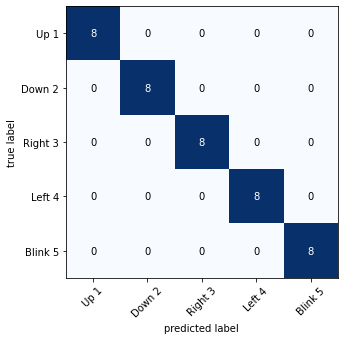

In [116]:
plot_confusion_matrix(conf_mat_log,class_names=["Up 1","Down 2","Right 3","Left 4", "Blink 5"],figsize=(12,5)); #fn

# AdaBoost Classifier

In [117]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier

In [118]:
abc = AdaBoostClassifier(n_estimators=30, learning_rate=0.04,base_estimator=RandomForestClassifier())

In [119]:
abc.fit(X_train,y_train)

C:\Users\EGYPT\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


AdaBoostClassifier(base_estimator=RandomForestClassifier(), learning_rate=0.04,
                   n_estimators=30)

In [120]:
abc.score(X_train,y_train)

1.0

In [121]:
abc.score(X_test,y_test)

1.0

In [122]:
error = abs(round(abc.score(X_test, y_test) -abc.score(X_train, y_train), 2))
error

0.0

In [123]:
ytest_pred_abc = abc.predict(X_test)

In [124]:
ytrain_pred_abc = abc.predict(X_train)

In [125]:
metrics.accuracy_score(y_test,ytest_pred_abc)

1.0

In [126]:
conf_mat_abc =confusion_matrix(y_test,ytest_pred_abc)
conf_mat_abc

array([[8, 0, 0, 0, 0],
       [0, 8, 0, 0, 0],
       [0, 0, 8, 0, 0],
       [0, 0, 0, 8, 0],
       [0, 0, 0, 0, 8]], dtype=int64)

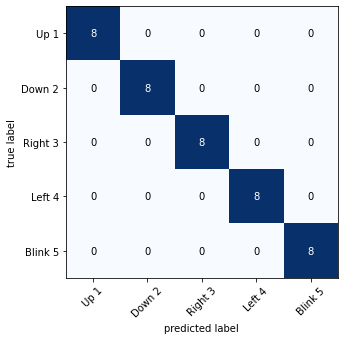

In [127]:
plot_confusion_matrix(conf_mat_abc,class_names=["Up 1","Down 2","Right 3","Left 4", "Blink 5"],figsize=(12,5)); #fn

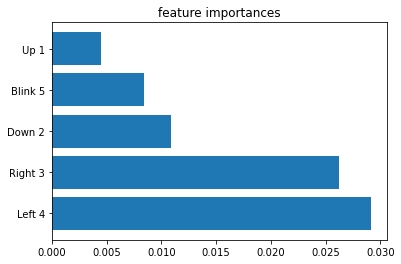

In [128]:
f_importances(abs(abc.feature_importances_), ["Up 1","Down 2","Right 3","Left 4", "Blink 5"], top=5)

# Test Sample